Generate a Report To Visualize a Service Workflow


Welcome to the Service Workflow Simulator 📊


Enter average waiting time per customer (minutes):  25
Enter service processing time per customer (minutes):  20
Enter number of service windows available:  10
Enter total operating minutes per day (accounting for breaks):  400



🔄 Each window processes 8 customers per day.
🏢 Total customers served daily: 80

📊 Generating animated service workflow chart...


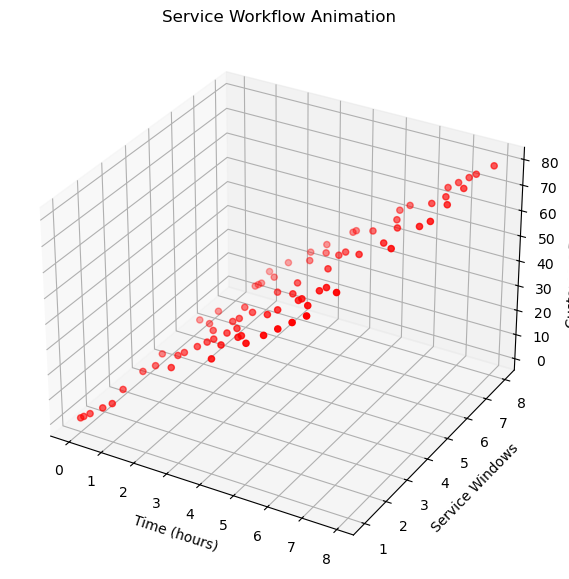

In [1]:
#Deploy Service Workflow Analyzer
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation
from IPython.display import HTML

# Function to calculate daily service capacity
def calculate_service_capacity(wait_time, service_time, windows, daily_minutes):
    total_cycles_per_window = daily_minutes // (wait_time + service_time)
    total_customers_served = total_cycles_per_window * windows
    
    print(f"\n🔄 Each window processes {total_cycles_per_window} customers per day.")
    print(f"🏢 Total customers served daily: {total_customers_served}")
    
    return total_customers_served

# User input function
def user_input():
    print("\nWelcome to the Service Workflow Simulator 📊")
    wait_time = int(input("Enter average waiting time per customer (minutes): "))
    service_time = int(input("Enter service processing time per customer (minutes): "))
    windows = int(input("Enter number of service windows available: "))
    daily_minutes = int(input("Enter total operating minutes per day (accounting for breaks): "))
    
    return wait_time, service_time, windows, daily_minutes

# Function to generate animated 3D workflow visualization
def animate_service_flow(customers_per_day):
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    
    # Generate time steps (hours of the workday)
    time_steps = np.linspace(0, 8, num=customers_per_day)
    windows = np.linspace(1, 8, num=8)  # 8 available windows
    customer_ids = np.arange(1, customers_per_day + 1)

    # Scatter plot initialization
    scatter = ax.scatter([], [], [], c='blue', marker='o')

    def update(num):
        ax.clear()
        ax.set_title("Service Workflow Animation")
        ax.set_xlabel("Time (hours)")
        ax.set_ylabel("Service Windows")
        ax.set_zlabel("Customers Processed")

        # Select points to animate
        animated_time = time_steps[:num]
        animated_windows = np.random.choice(windows, num)  # Random assignment to service windows
        animated_customers = customer_ids[:num]

        # Update scatter plot
        ax.scatter(animated_time, animated_windows, animated_customers, c='red', marker='o')

    # Assign animation to a variable to prevent deletion
    anim = animation.FuncAnimation(fig, update, frames=customers_per_day, interval=100, repeat=False)

    # Display the animation inside Jupyter Lab
    return HTML(anim.to_jshtml())

# Main function to run the simulation
def main():
    wait_time, service_time, windows, daily_minutes = user_input()
    daily_capacity = calculate_service_capacity(wait_time, service_time, windows, daily_minutes)
    
    print("\n📊 Generating animated service workflow chart...")
    return animate_service_flow(daily_capacity)

# Run the function and display the animation in Jupyter
main()
